In [1]:
import earthaccess
import xarray as xr
import numpy as np
import matplotlib
matplotlib.use('Agg')  # Non-interactive plotting for saving figures
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import ssl
import os
import pyarrow as pa
import pyarrow.parquet as pq
import pandas as pd

In [2]:
# %run ~/Desktop/Hackweek/camel_to_parq.py

In [3]:
auth = earthaccess.login()

In [4]:
short_name = "PACE_SPEXONE_L3M_AER_RTAP"  # Change this if a different short name is used
start_date = "2024-06"
end_date = "2025-06"
# bbox = (-10, 20, 45, 75)    # (west, south, east, North) (-10, 20, 45, 75) 
# bbox = (-76.75, 36.97, -75.74, 39.01)
# results = earthaccess.search_data(
results = earthaccess.search_data(
    short_name=short_name,
    temporal=(start_date,end_date),
    granule_name="*.DAY.*0p1deg*",  # Daily only for MOANA | Resolution: 0p1deg or 4 (for 4km)

)
len(results)

169

In [5]:
# paths = earthaccess.open(results[0])
paths = earthaccess.open(results)

QUEUEING TASKS | :   0%|          | 0/169 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/169 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/169 [00:00<?, ?it/s]

In [6]:
variables = [ 'ssa', 'aot', 'fmf','mr','mi','aot']
wvl = [440, 550, 675, 870, 1064]
len(paths)

169

In [8]:
# table

In [90]:
parquet_path = '~/Desktop/SPEXone_extract_L3_test.parquet'
pqwriter = None  # Will be created on first write

for f in paths[:20]: 
    ds = xr.open_datatree(f)
    
    # Check if required variables exist
    # You can uncomment if needed
    # required = ['aot', 'lat', 'lon', 'wavelength']
    # if not all(v in ds.variables for v in required):
    #     print(f"--> Skipping {f}: missing required variables")
    #     continue

    aod = ds['aot']
    date = ds.attrs.get("time_coverage_start")
    print(date)
    # Compute valid mask at 550 nm
    valid_mask = aod.sel(wavelength=550.) >= 0.05
    
    lat_vals = ds['lat'].values  # 1D
    lon_vals = ds['lon'].values  # 1D
    
    valid_lat_idx, valid_lon_idx = np.where(valid_mask.values)
    if len(valid_lat_idx) == 0:
        continue  # Skip file if no valid points
    
    # Get lat/lon for valid points
    valid_lats = lat_vals[valid_lat_idx]
    valid_lons = lon_vals[valid_lon_idx]
    
    df_out = {
        'lat': valid_lats,
        'lon': valid_lons,
        'date': [date] * len(valid_lats)
    }
    
    # Loop through selected variables and wavelengths
    for var in variables:
        for w in wvl:
            var_data = ds[var].sel(wavelength=w, drop=True).values  # shape: (lat, lon)
            valid_values = var_data[valid_lat_idx, valid_lon_idx]
            df_out[f"{var}_{w}nm"] = valid_values

    # Create DataFrame and write to Parquet
    df = pd.DataFrame(df_out)
    table = pa.Table.from_pandas(df)
    
    if pqwriter is None:
        pqwriter = pq.ParquetWriter(parquet_path, table.schema, use_dictionary=True, compression='snappy')
    
    pqwriter.write_table(table)

# Close the writer at the end
if pqwriter:
    pqwriter.close()


2024-02-23T19:36:01.000Z
2024-02-24T02:09:23.000Z
2024-02-26T01:31:18.000Z
2024-02-28T02:46:35.000Z
2024-02-29T13:06:45.000Z
2024-03-02T01:10:16.000Z
2024-03-03T01:50:24.000Z
2024-03-05T01:22:18.000Z
2024-03-06T01:57:25.000Z
2024-03-08T01:29:18.000Z
2024-03-09T01:59:25.000Z
2024-03-11T01:26:20.000Z
2024-03-12T02:16:26.000Z
2024-03-16T01:10:10.000Z
2024-03-17T01:50:16.000Z
2024-03-20T01:57:12.000Z
2024-03-22T01:29:02.000Z
2024-03-23T02:04:07.000Z
2024-03-25T01:35:59.000Z
2024-03-26T02:06:04.000Z


In [3]:
parquet_path= '~/Desktop/SPEXone_extract_L3_2024-04_2025-04.parquet'
df = pd.read_parquet(parquet_path)
df['date'].iloc[-1]


'2025-03-31T01:31:39.000Z'

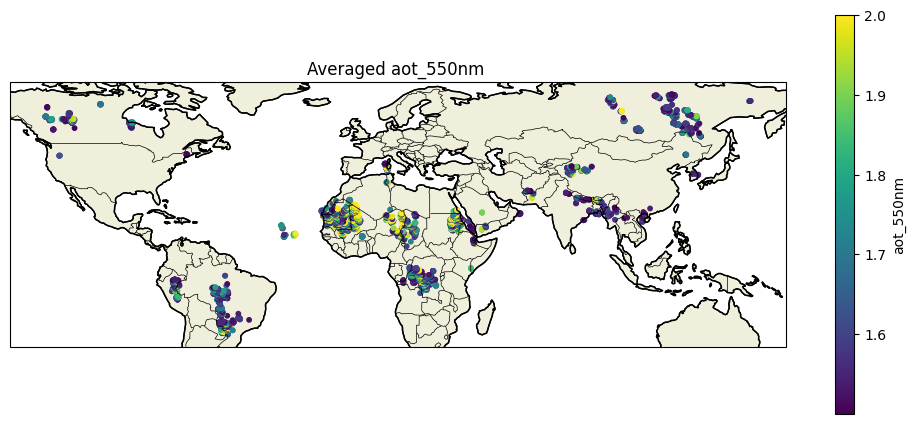

In [39]:
plot_df= df[df['aot_550nm'] > 1.5]

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

plot_var = 'aot_550nm'
# # Group by lat/lon and average the selected variable
df_avg = plot_df.groupby(['lat', 'lon'])[plot_var].mean().reset_index()

# ---- Step 3: Plot on map ----
fig = plt.figure(figsize=(10, 6))
ax = plt.axes(projection=ccrs.PlateCarree())
sc = ax.scatter(
    df_avg['lon'], df_avg['lat'], c=df_avg[plot_var],
    cmap='viridis', s=10, transform=ccrs.PlateCarree(),vmax=2
)

ax.coastlines()
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, edgecolor='black')
ax.set_title(f"Averaged {plot_var} ")
plt.colorbar(sc, label=plot_var, orientation='vertical', shrink=0.7)
plt.tight_layout()
plt.show()



In [43]:
df[df['aot_550nm'] > 2]

AttributeError: 'DataFrame' object has no attribute 'unique'

In [44]:
len(df[df['aot_550nm'] > 2])
np.unique(df[df['aot_550nm'] > 2]['date'])

array(['2024-04-25T01:35:17.000Z', '2024-04-28T01:41:53.000Z',
       '2024-04-30T01:18:17.000Z', '2024-05-14T01:10:31.000Z',
       '2024-05-15T01:40:24.000Z', '2024-05-17T01:11:51.000Z',
       '2024-05-18T01:51:44.000Z', '2024-05-20T01:18:09.000Z',
       '2024-05-21T01:53:01.000Z', '2024-05-23T01:24:26.000Z',
       '2024-06-01T01:47:30.000Z', '2024-06-04T01:53:34.000Z',
       '2024-06-09T01:30:48.000Z', '2024-06-10T02:00:33.000Z',
       '2024-06-12T01:36:44.000Z', '2024-06-15T01:42:39.000Z',
       '2024-06-17T01:18:47.000Z', '2024-06-18T01:43:31.000Z',
       '2024-06-20T01:19:39.000Z', '2024-06-21T01:54:22.000Z',
       '2024-06-29T01:37:01.000Z', '2024-07-02T01:42:45.000Z',
       '2024-07-04T01:18:48.000Z', '2024-07-05T01:48:28.000Z',
       '2024-07-07T01:19:30.000Z', '2024-07-08T01:54:04.000Z',
       '2024-07-10T01:25:02.000Z', '2024-07-11T01:01:22.000Z',
       '2024-07-13T01:30:39.000Z', '2024-07-14T02:05:16.000Z',
       '2024-07-16T01:36:12.000Z', '2024-07-19T01:46:45

In [6]:
%matplotlib inline

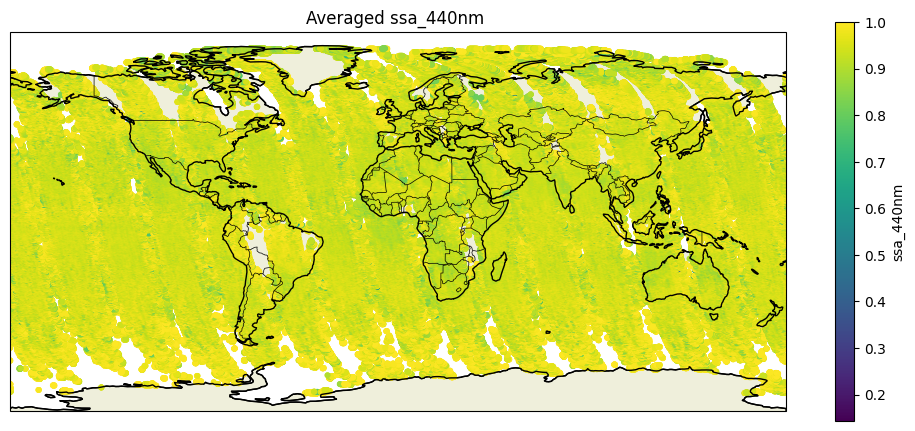

ploted ssa_440nm


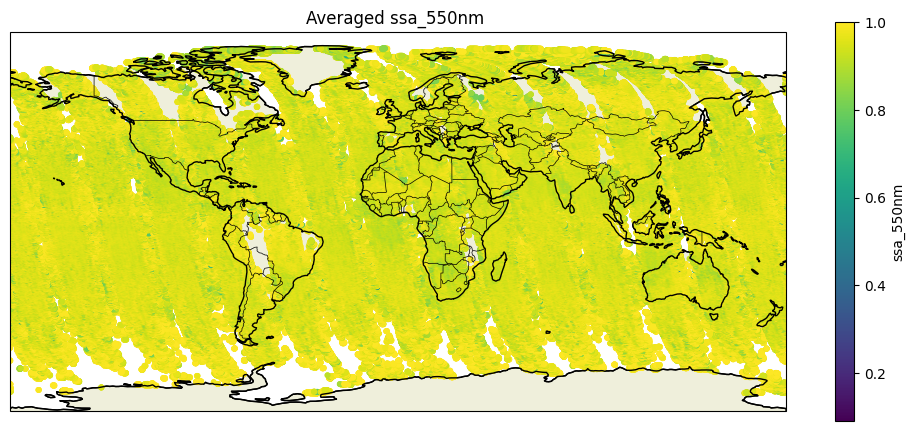

ploted ssa_550nm


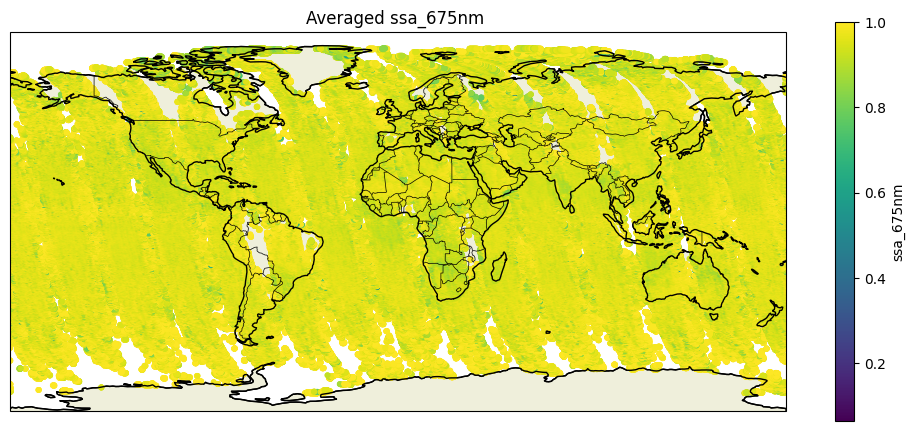

ploted ssa_675nm


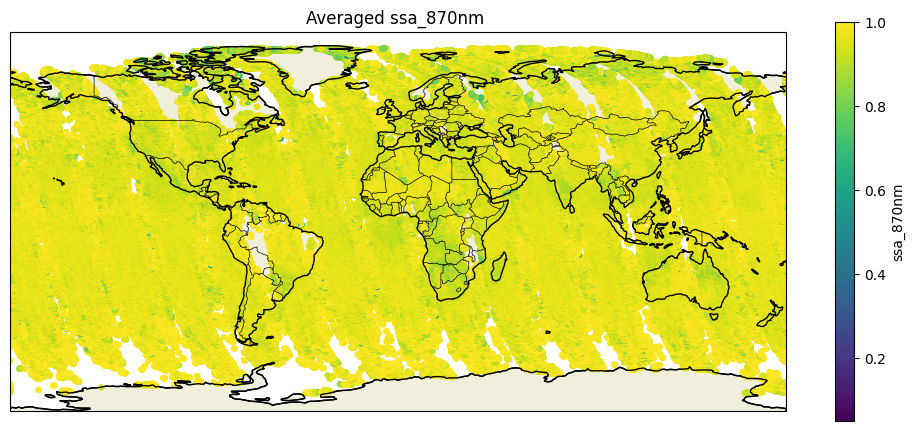

ploted ssa_870nm


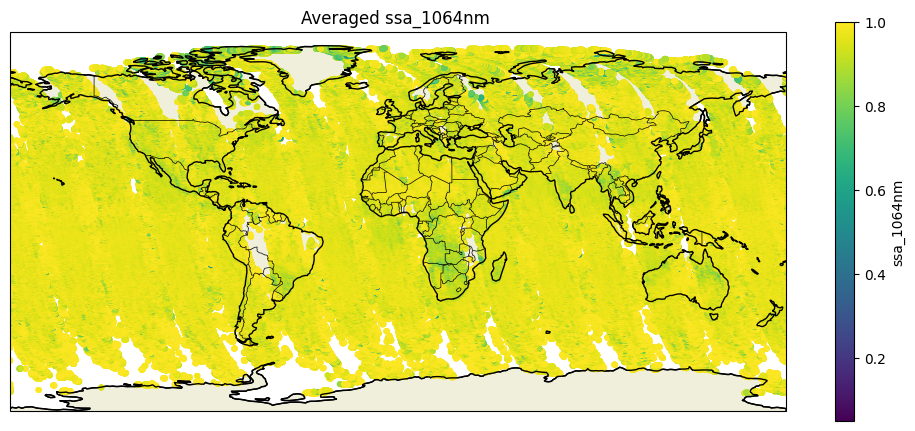

ploted ssa_1064nm


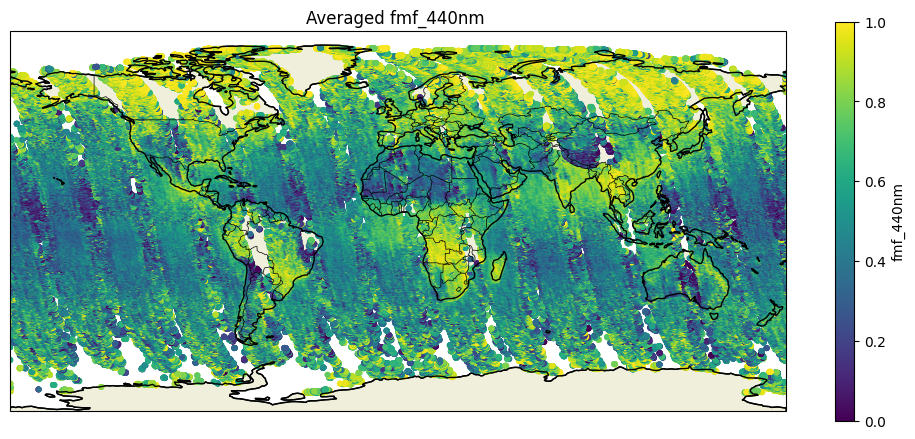

ploted fmf_440nm


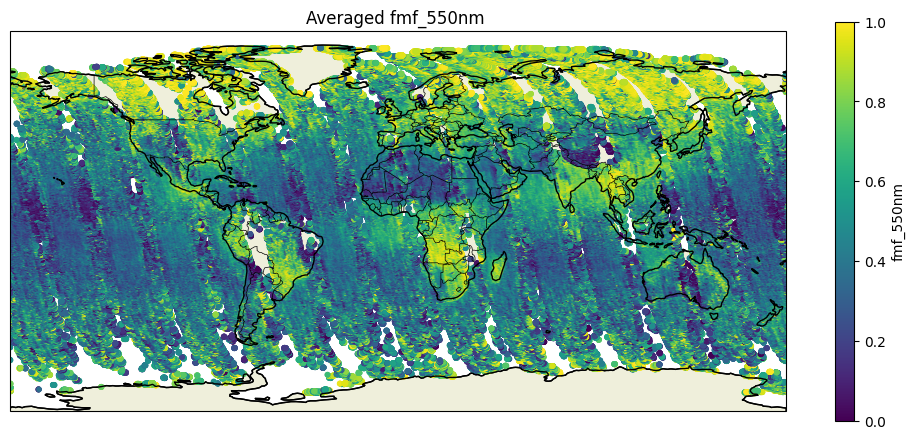

ploted fmf_550nm


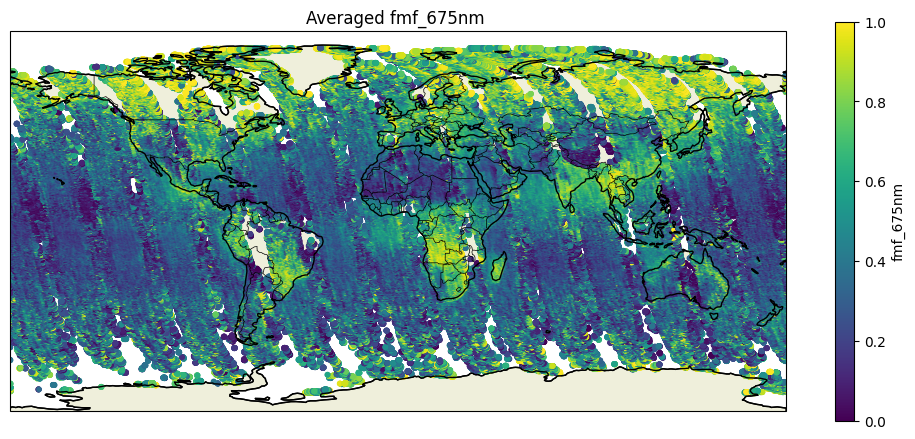

ploted fmf_675nm


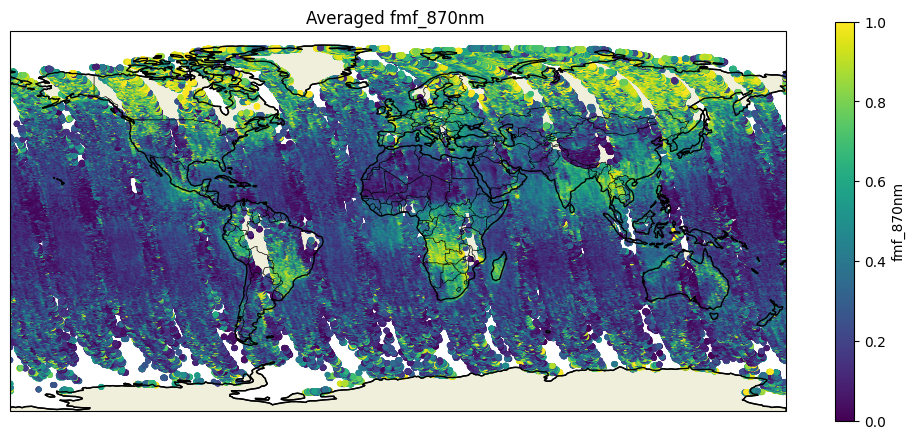

ploted fmf_870nm


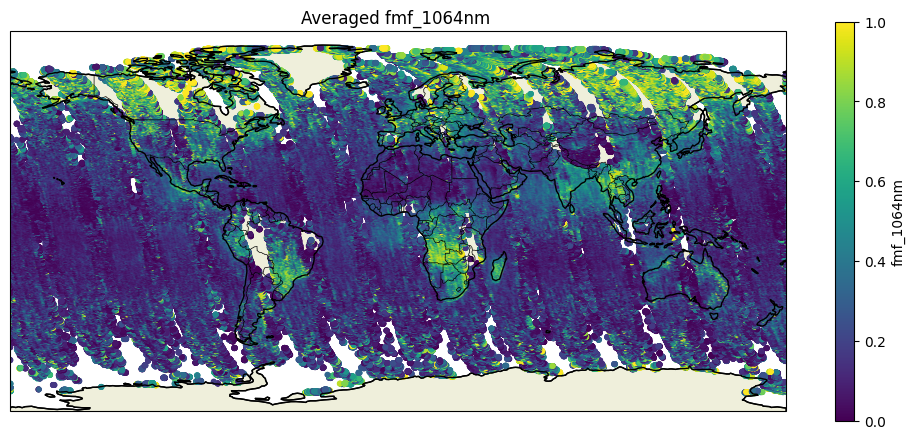

ploted fmf_1064nm


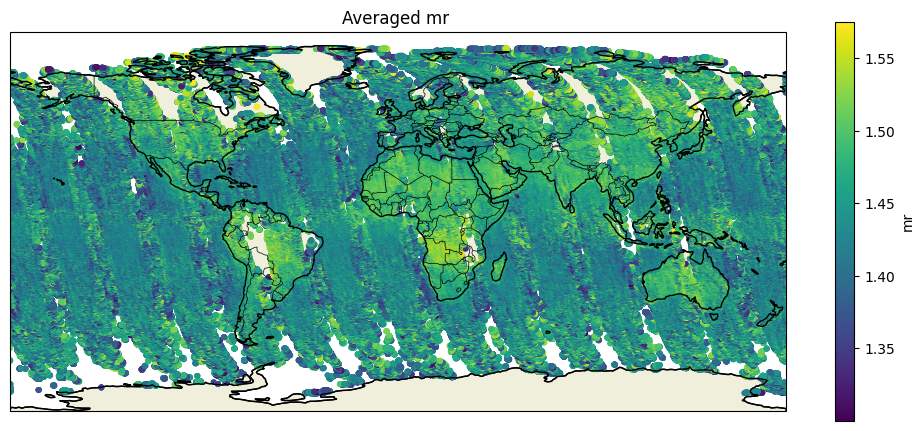

ploted mr


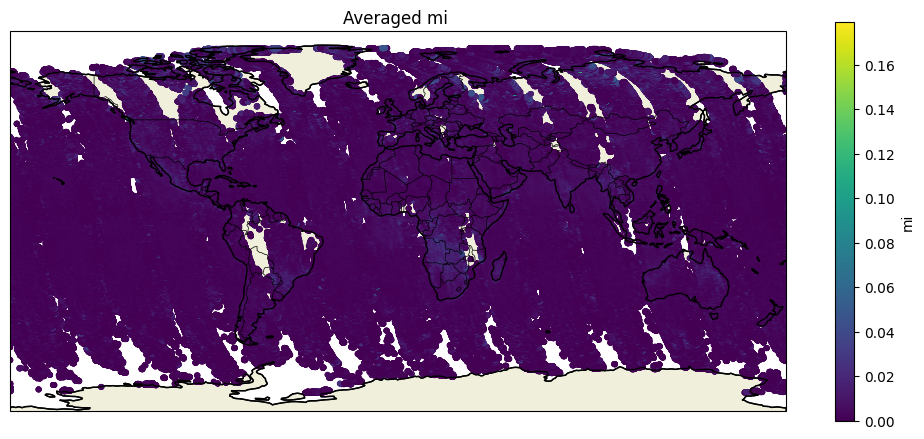

ploted mi


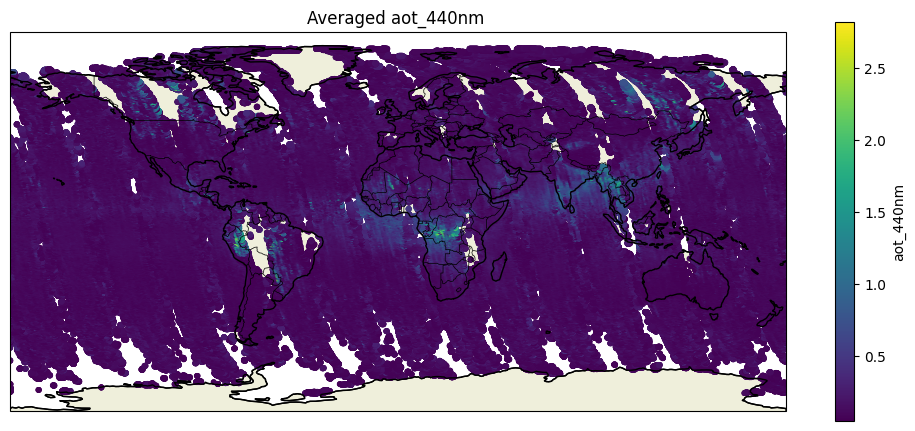

ploted aot_440nm


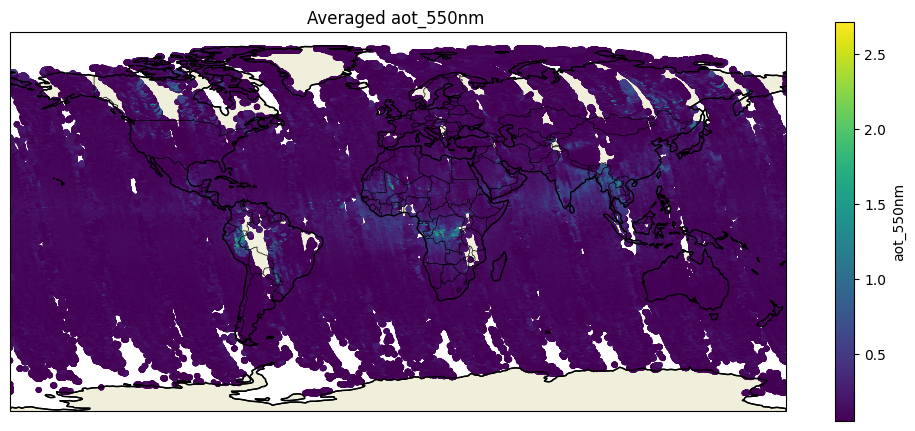

ploted aot_550nm


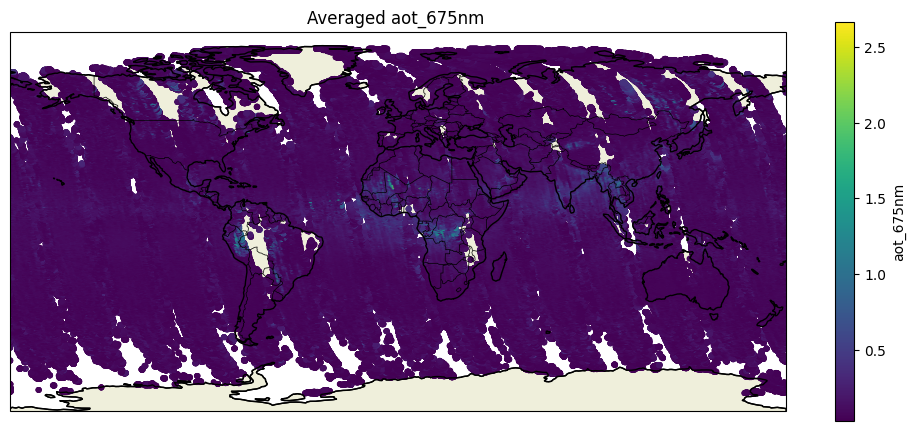

ploted aot_675nm


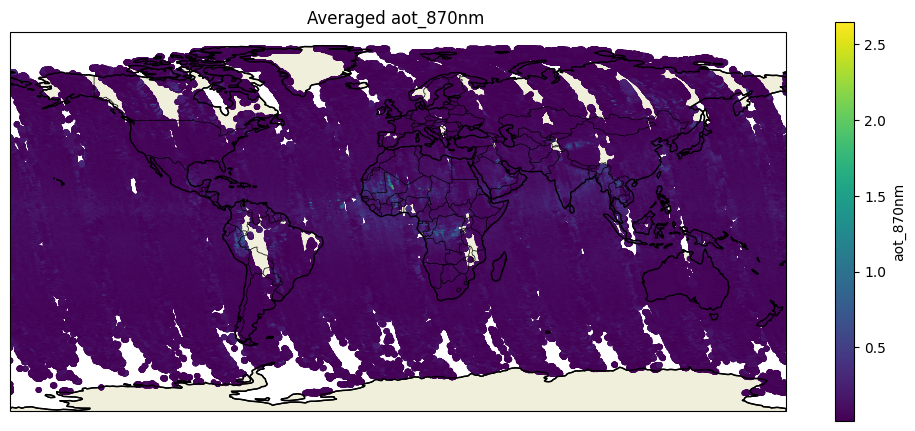

ploted aot_870nm


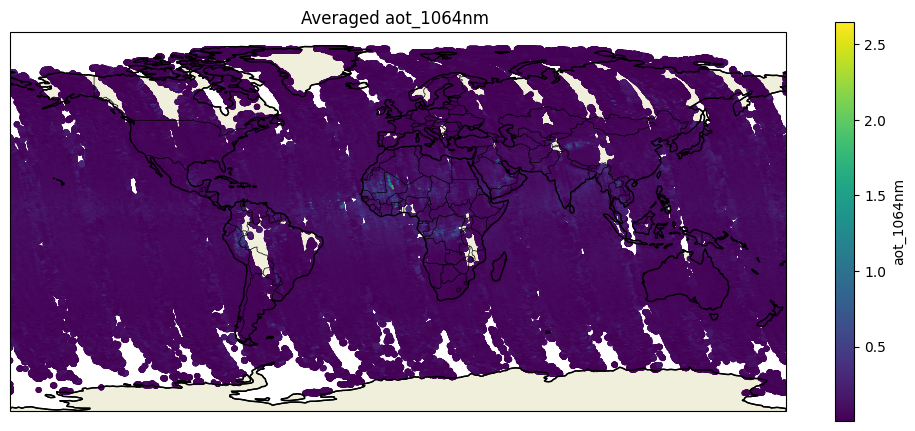

ploted aot_1064nm


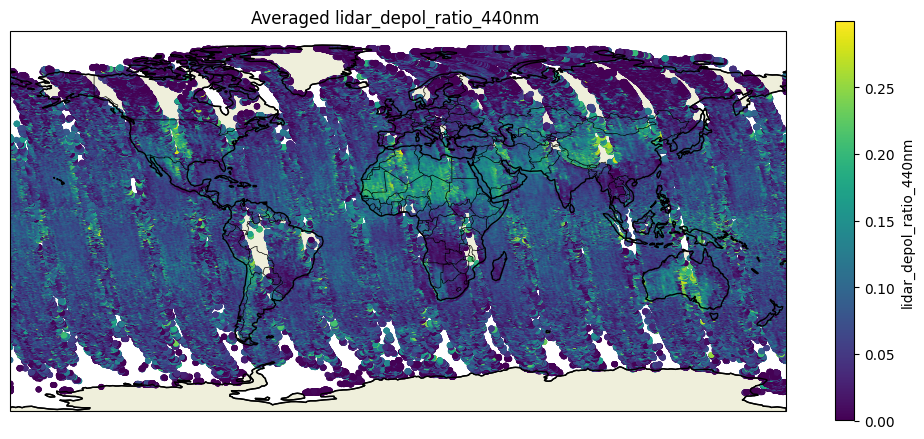

ploted lidar_depol_ratio_440nm


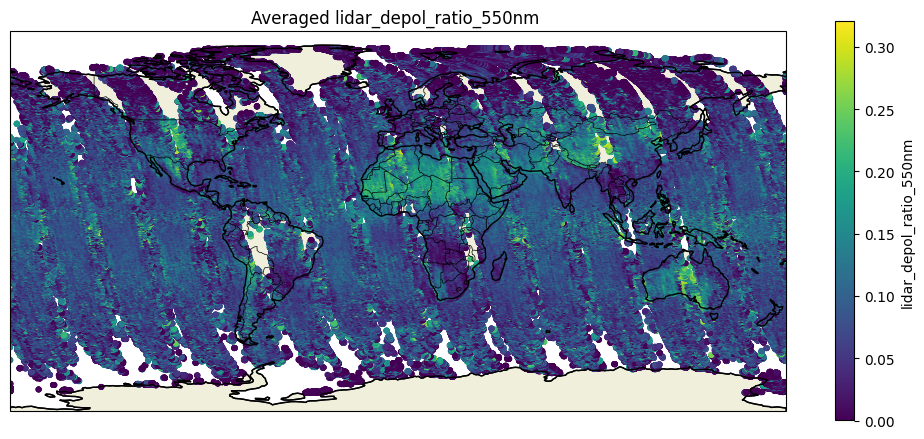

ploted lidar_depol_ratio_550nm


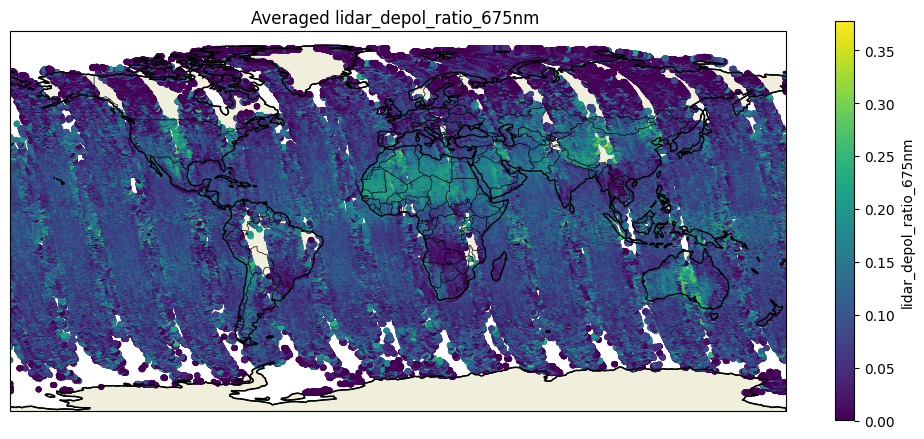

ploted lidar_depol_ratio_675nm


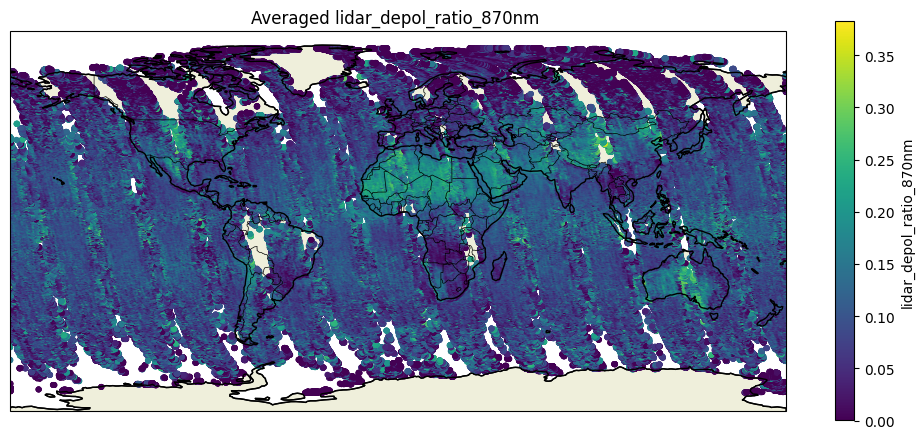

ploted lidar_depol_ratio_870nm


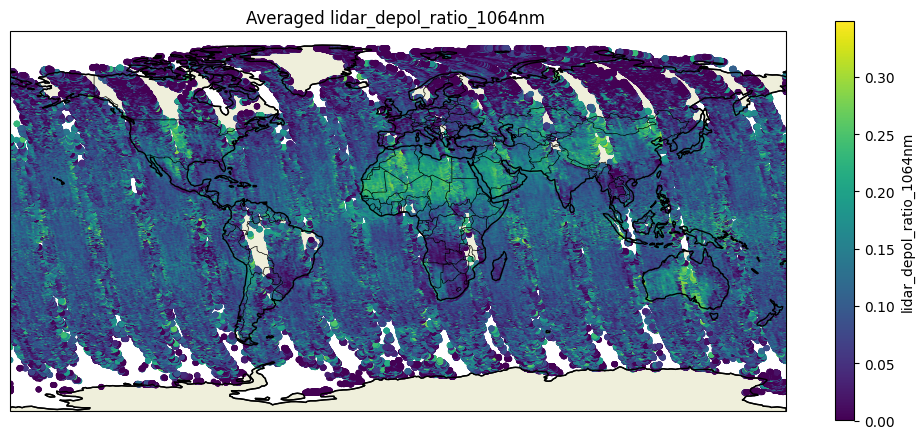

ploted lidar_depol_ratio_1064nm


In [50]:

import pandas as pd
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
feature_cols = [col for col in df.columns if col not in ['lat', 'lon', 'date']]
for plot_var in feature_cols:
    # plot_var = 'mi'
    # Group by lat/lon and average the selected variable
    df_avg = df.groupby(['lat', 'lon'])[plot_var].mean().reset_index()
    
    # ---- Step 3: Plot on map ----
    fig = plt.figure(figsize=(10, 6))
    ax = plt.axes(projection=ccrs.PlateCarree())
    sc = ax.scatter(
        df_avg['lon'], df_avg['lat'], c=df_avg[plot_var],
        cmap='viridis', s=10, transform=ccrs.PlateCarree()
    )
    
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAND, edgecolor='black')
    ax.set_title(f"Averaged {plot_var} ")
    plt.colorbar(sc, label=plot_var, orientation='vertical', shrink=0.7)
    plt.tight_layout()
    plt.show()
    print(f'ploted {plot_var}')
    # plt.savefig(f'~/Desktop/SPEXone_annual_{plot_var}_average.png')


In [26]:

import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Step 2: Select only the numeric variable columns
# Exclude lat, lon, and date
feature_cols = [col for col in df.columns if col not in ['lat', 'lon', 'date']]
X = df[feature_cols].dropna()

# Step 3: Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 4: Apply PCA
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)

# Optional: Print explained variance
print("Explained variance ratio (3 components):", pca.explained_variance_ratio_)



Explained variance ratio (3 components): [0.45738176 0.2201526  0.1674743  0.1043921 ]


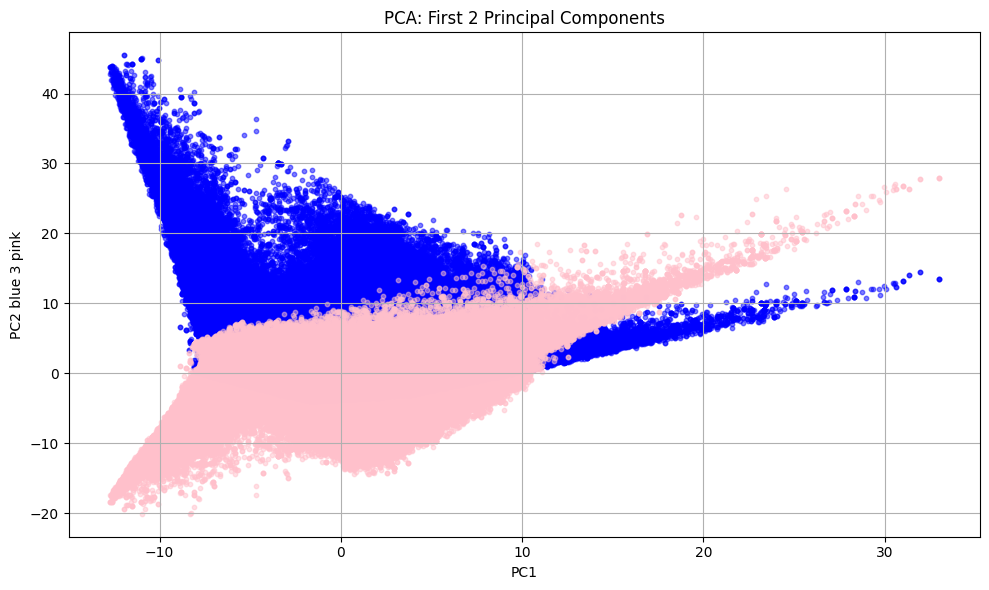

In [27]:

# Step 5: Plot the first two principal components
plt.figure(figsize=(10, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c='blue', s=10, alpha=0.5)
plt.scatter(X_pca[:, 0], X_pca[:, 2], c='pink', s=10, alpha=0.5)
plt.xlabel('PC1')
plt.ylabel('PC2 blue 3 pink')
plt.title('PCA: First 2 Principal Components')
plt.grid(True)
plt.tight_layout()
plt.show()

In [16]:
from sklearn.cluster import k_means
import matplotlib.pyplot as plt 
n_clusters = 4
centroids, labels, inertia = k_means(
    X_pca, 
    n_clusters=n_clusters, 
    init='k-means++', 
    n_init='auto', 
    max_iter=300, 
    tol=1e-4, 
    random_state=42, 
    return_n_iter=False
)



In [28]:
centroids

array([[-0.04574941,  7.430025  , -3.0271628 ],
       [-1.9072893 , -0.37780336,  0.07695924],
       [ 3.3119898 , -0.11630309,  0.18083182]], dtype=float32)

In [29]:
inertia

89623728.0

/tmp/ipykernel_1775/455195089.py:9: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/srv/conda/envs/notebook/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


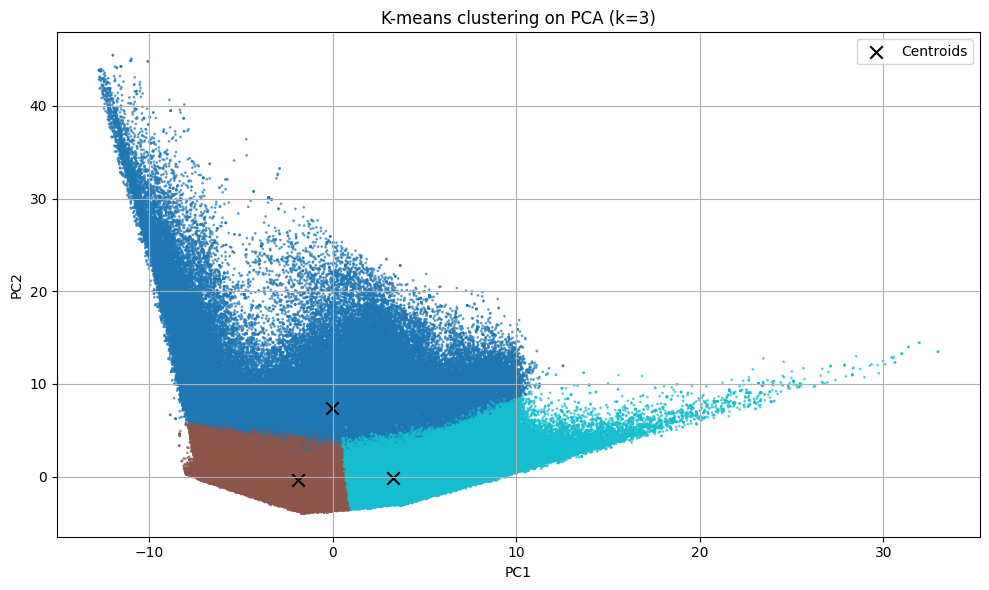

In [30]:
plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, cmap='tab10', s=1, alpha=0.6)
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=80, marker='x', label='Centroids')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title(f'K-means clustering on PCA (k={n_clusters})')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [24]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

# n_clusters = 3
X = df[feature_cols].dropna()
distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)

for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=42).fit(X)
    
    distortions.append(sum(np.min(cdist(X, kmeanModel.cluster_centers_, 'euclidean'), axis=1)**2) / X.shape[0])
    
    inertias.append(kmeanModel.inertia_)
    
    mapping1[k] = distortions[-1]
    mapping2[k] = inertias[-1]


Distortion values:
1 : 0.4426592816323516
2 : 0.2066329515227071
3 : 0.17627261078502982
4 : 0.12136831371022463
5 : 0.10078971719703353
6 : 0.08966162916032847
7 : 0.08000827722421841
8 : 0.07464591048777279
9 : 0.06826412552138442


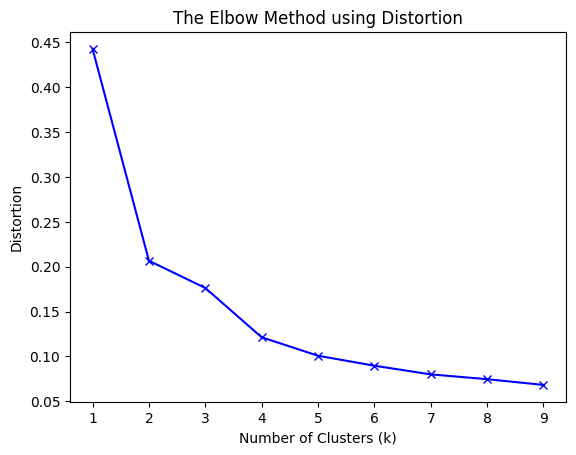

In [25]:
print("Distortion values:")
for key, val in mapping1.items():
    print(f'{key} : {val}')

plt.plot(K, distortions, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()

In [31]:
mapping2

{1: 3946332.0,
 2: 1844716.5,
 3: 1574191.875,
 4: 1084016.75,
 5: 900168.9375,
 6: 800898.0,
 7: 714701.6875,
 8: 666798.9375,
 9: 609839.625}

# Cases 